In [25]:
#!pip install vaderSentiment

In [34]:
import tweepy
import json
import pandas as pd
import numpy as np
import os
import matplotlib as matplotlib
import matplotlib.pyplot as plt
import datetime as datetime
import time

# Twitter API Keys
from config import (consumer_key, consumer_secret, access_token, access_token_secret)

# Setup Tweepy API Authentication
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
# api = tweepy.API(auth, parser=tweepy.parsers.JSONParser())
api = tweepy.API(auth)

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

In [35]:
orig_working_directory= os.getcwd()
print(orig_working_directory)

/Users/patty_cake/Desktop/gw/gwu-arl-data-pt-03-2020-u-c/02-Homework/06-Python-APIs/Twitter-API-Instructions


In [45]:
# Set Target Search Term
target_terms = ('@bbcworld', '@cbsnews', '@cnn', '@foxnews', '@nytimes')

# News Org Filters
min_tweets = 5
max_tweets = 10000
max_followers = 2500
max_following = 2500

# List to hold results
tweets_list = []
search_term_list = []

In [46]:
# Loop through all targets
for target in target_terms:
    for tweet in tweepy.Cursor(api.search, target, tweet_mode='extended').items(100):
        tweets_list.append(tweet)    
        search_term_list.append(target)
        #time.sleep(0.1)
tweets_list

[Status(_api=<tweepy.api.API object at 0x121d95310>, _json={'created_at': 'Sun May 24 00:08:49 +0000 2020', 'id': 1264347585730342912, 'id_str': '1264347585730342912', 'full_text': "RT @BBCWorld: Stan's Donuts: A farewell to a shop closed by coronavirus https://t.co/aCY4sJLQdq", 'truncated': False, 'display_text_range': [0, 95], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'BBCWorld', 'name': 'BBC News (World)', 'id': 742143, 'id_str': '742143', 'indices': [3, 12]}], 'urls': [{'url': 'https://t.co/aCY4sJLQdq', 'expanded_url': 'https://bbc.in/36qkR7l', 'display_url': 'bbc.in/36qkR7l', 'indices': [72, 95]}]}, 'metadata': {'iso_language_code': 'en', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 464899199, 'id

In [48]:
#create lists 
user_list = []
tweet_text_list = []
compound_list = []
positive_list = []
negative_list = []
neutral_list = []
timestamp_list = []

# Loop through all tweets
for tweet in tweets_list:
    if(
        True
    ):
        # Run Vader Analysis on each tweet
        tweet_user = tweet.user.screen_name
        tweet_text = tweet.full_text
        results = analyzer.polarity_scores(tweet_text)
        compound = results["compound"]
        pos = results["pos"]
        neu = results["neu"]
        neg = results["neg"]
        timestamp = tweet.created_at.timestamp()
    
        # Add each value to the appropriate list
        user_list.append(tweet_user)
        tweet_text_list.append(tweet_text)
        compound_list.append(compound)
        positive_list.append(pos)
        negative_list.append(neg)
        neutral_list.append(neu)
        timestamp_list.append(timestamp)

In [49]:

#Put results into a DataFrame
results_df = pd.DataFrame({ 'User': user_list,
    'Search Term': search_term_list,
    'Tweet Text': tweet_text_list,
    'Compound Score': compound_list,
    'Positive': positive_list,
    'Neutral': negative_list,
    'Negative': neutral_list,
    'Timestamp': timestamp_list
})

pd.set_option('display.max_colwidth', -1)

results_df

/Users/patty_cake/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  if sys.path[0] == '':


,User,Search Term,Tweet Text,Compound Score,Positive,Neutral,Negative,Timestamp
0,Shutzy59,@bbcworld,RT @BBCWorld: Stan's Donuts: A farewell to a shop closed by coronavirus https://t.co/aCY4sJLQdq,0.0000,0.000,0.000,1.000,1.590293e+09
1,Iceman_cometh1,@bbcworld,RT @BBCWorld: Over 40 coronavirus cases traced to church service in Germany after lockdown was eased https://t.co/15XNkarQHk,0.2960,0.121,0.000,0.879,1.590293e+09
2,jmlp85,@bbcworld,@MelpliusEli @Patrici54417503 @BBCWorld and honestly saying to me educate yourself after defined wrongly very known things like gravity and faith it shows how little humble you are and how close your mind is unprepared to exchange any argumentation with anybody,0.8207,0.188,0.000,0.812,1.590293e+09
3,zjmng1,@bbcworld,@BBCWorld still a sad number.,-0.4215,0.176,0.419,0.405,1.590293e+09
4,jpak25,@bbcworld,RT @NickBryantNY: Hardship in American suburbia - hard to comprehend the length of the queue at this commuter belt foodbank or the high-end…,-0.4019,0.000,0.150,0.850,1.590293e+09
...,...,...,...,...,...,...,...,...
495,EMF_7,@nytimes,"@jadabird @nytimes These states implement regulations that required nursing homes to accept #COVID19 patients.\n\nNY, NJ, PA, MI, MA,CA\n\nUSS Comfort Ship Javitz Center were empty.\n\nNo Doctors spoke up !\nBasic Infectious Disease 101\n\nCOVID patients with Elderly will definitely inflate the numbers.",0.6239,0.158,0.078,0.763,1.590293e+09
496,KingBostero,@nytimes,"@CincoPorcientoo @EquisdoRS @Grisito_ @Roman22102 @porquetendencia @nytimes El año pasado tuvieron el % de desempleo más bajo en 50 años, este año con una pandemia mundial de por medio no superan el 15%, nosotros desde hace 15 años no bajamos del 30% y sin pandemia! No podemos cargar a nadie, una vez q pase esto EEUU en dos meses se recupera, nosotros no https://t.co/uds58nVvSF",-0.8932,0.000,0.180,0.820,1.590293e+09
497,TravelingUS,@nytimes,RT @frannie1225: @nytimes https://t.co/1KSgdp4aQC\n@MarALago @FoxNews MEANWHILE TRUMP IS GOLFING TO HIS HEARTS CONTENT &amp; HE DOESN'T GIVE A D…,0.0000,0.000,0.000,1.000,1.590293e+09
498,CarolynWyllie,@nytimes,RT @jcrutchmer: the front page of sunday’s @nytimes. https://t.co/L2xF8fPg4u,0.0000,0.000,0.000,1.000,1.590293e+09


In [56]:
# Export & Save to a csv here:
#results_df.to_csv("twitter_sentiment.csv")




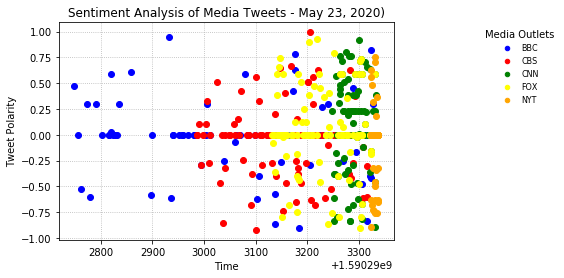

In [57]:
# Scatter plot of sentiments of the last 100 tweets pushed by each news organization
bbc_df = results_df[results_df["Search Term"]=='@bbcworld']


cbs_df = results_df[results_df['Search Term']=='@cbsnews']
cnn_df = results_df[results_df['Search Term']=='@cnn']
fox_df = results_df[results_df['Search Term']=='@foxnews']
nyt_df = results_df[results_df['Search Term']=='@nytimes']



plt.plot(bbc_df["Timestamp"], bbc_df["Compound Score"], marker="o", color = 'blue', linestyle=':', linewidth=0)
plt.plot(cbs_df["Timestamp"], cbs_df["Compound Score"], marker="o", color = 'red', linestyle=':', linewidth=0)
plt.plot(cnn_df["Timestamp"], cnn_df["Compound Score"], marker="o", color = 'green', linestyle=':', linewidth=0)
plt.plot(fox_df["Timestamp"], fox_df["Compound Score"], marker="o", color = 'yellow', linestyle=':', linewidth=0)
plt.plot(nyt_df["Timestamp"], nyt_df["Compound Score"], marker="o", color = 'orange',linestyle=':', linewidth=0)





plt.grid(linestyle='dotted')
plt.title("Sentiment Analysis of Media Tweets - May 23, 2020)")
plt.ylabel("Tweet Polarity")
plt.xlabel("Time")
plt.legend(('BBC', 'CBS', 'CNN', 'FOX', 'NYT'),scatterpoints=1,loc='upper left',bbox_to_anchor=(1.25, 1),ncol=1,\
           fontsize=8, markerscale=0.75,title='Media Outlets',edgecolor='none',framealpha=1.00)




#plt.savefig("Sentiment_Analysis.png") 
plt.show()

In [58]:
results_df_group = results_df.groupby('Search Term')
summary_df = results_df_group['Compound Score','Positive','Neutral','Negative'].mean()
summary_df['Count'] = results_df_group['User'].count()
summary_df

/Users/patty_cake/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,Compound Score,Positive,Neutral,Negative,Count
Search Term,,,,,
@bbcworld,-0.010420,0.03935,0.05092,0.90971,100
@cbsnews,-0.050644,0.06221,0.07925,0.85854,100
@cnn,0.080493,0.08644,0.05913,0.85441,100
@foxnews,0.045422,0.06781,0.05014,0.88204,100
@nytimes,-0.050538,0.02535,0.03644,0.93819,100


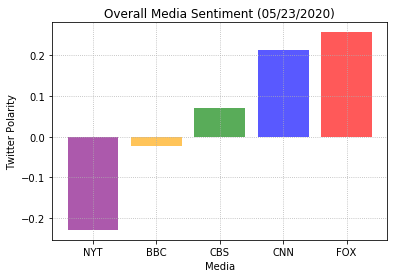

In [60]:
# Plot overall media sentiment on bar graph from summary_df
media_agg = ['NYT', 'BBC', 'CBS', 'CNN', 'FOX']
sentiment = [-0.229, -0.022, 0.071, 0.213, 0.257]
x_axis = np.arange(len(sentiment))

colors = ['purple', 'orange', 'green', 'blue', 'red']

plt.bar(x_axis, sentiment, color=colors, alpha=0.65, align='edge')

tick_locations = [value+0.4 for value in x_axis]
plt.xticks(tick_locations, ["NYT", "BBC", "CBS", "CNN", "FOX"])
plt.grid(linestyle='dotted')
plt.title("Overall Media Sentiment (05/23/2020)")
plt.xlabel("Media")
plt.ylabel("Twitter Polarity")

#plt.savefig("Media_Mean_Sentiment.png")
plt.show()

In [61]:
Looking at the two graphs above, one can tell that the NYT & BBC have more negative setinent when it come to their tweets. However, NYT is the worst out of the two. While the rest, CBS, CNN, & Fox have more positive sentinent.
From the scatter plot one can see that NYT & Fox have more twitter posting, and BBC has the least since it takes BBC a longer time to get to the 100 tweets.    

SyntaxError: invalid syntax (<ipython-input-61-294108835fab>, line 1)